In [43]:
#import all required libraires
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width',1000)
import matplotlib.cm as cm            # Matplotlib and associated plotting modules
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans  # import k-means from clustering stage
from sklearn.metrics import silhouette_score
import folium                        # map rendering library
import json # library to handle JSON files
from pandas.io.json import json_normalize
from geopy.geocoders import Nominatim
import requests # library to handle requests
import webbrowser
import pgeocode

In [44]:
#getting cordinates for Mumbai
address = 'Mumbai'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Mumbai are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Mumbai are 19.0759899, 72.8773928.


In [45]:
#read data from the webpage
url = 'https://en.wikipedia.org/wiki/List_of_neighbourhoods_in_Mumbai'
df1 = pd.read_html(url)
type(df1)

list

In [46]:
df1

[                                               0                                1          2          3
 0                                           Area                         Location   Latitude  Longitude
 1                                         Amboli          Andheri,Western Suburbs    19.1293    72.8434
 2                               Chakala, Andheri                  Western Suburbs  19.111388  72.860833
 3                                     D.N. Nagar          Andheri,Western Suburbs  19.124085  72.831373
 4                                 Four Bungalows          Andheri,Western Suburbs  19.124714   72.82721
 5                                    Lokhandwala          Andheri,Western Suburbs  19.130815   72.82927
 6                                          Marol          Andheri,Western Suburbs  19.119219  72.882743
 7                                          Sahar          Andheri,Western Suburbs  19.098889  72.867222
 8                                Seven Bungalows      

In [47]:
#to convert data into dataframe, first need to convert into nummpy array,then tranpose the list
df2_T0 = np.array(df1[0][0]).T.tolist()
df2_T1 = np.array(df1[0][1]).T.tolist()
df2_T2 = np.array(df1[0][2]).T.tolist()
df2_T3 = np.array(df1[0][3]).T.tolist()
#noq combine the list and convert into a dataframe
df3=pd.DataFrame(list(zip(df2_T0, df2_T1,df2_T2,df2_T3)),
             columns=['Area','Location','Latitude','Longitude'])
type(df3)

pandas.core.frame.DataFrame

In [48]:
MumbaiLatLan=df3.drop(df3.index[0])
MumbaiLatLan

,Area,Location,Latitude,Longitude
1,Amboli,"Andheri,Western Suburbs",19.1293,72.8434
2,"Chakala, Andheri",Western Suburbs,19.111388,72.860833
3,D.N. Nagar,"Andheri,Western Suburbs",19.124085,72.831373
4,Four Bungalows,"Andheri,Western Suburbs",19.124714,72.82721
5,Lokhandwala,"Andheri,Western Suburbs",19.130815,72.82927
6,Marol,"Andheri,Western Suburbs",19.119219,72.882743
7,Sahar,"Andheri,Western Suburbs",19.098889,72.867222
8,Seven Bungalows,"Andheri,Western Suburbs",19.129052,72.817018
9,Versova,"Andheri,Western Suburbs",19.12,72.82
10,Mira Road,"Mira-Bhayandar,Western Suburbs",19.284167,72.871111


In [49]:
# create map of Mumbai using latitude and longitude values
map_Mumbai = folium.Map(location=[latitude, longitude], zoom_start=11)
# add markers to map

map_Mumbai

In [50]:
# create map of Mumbai using latitude and longitude values
map_mumbai = folium.Map(location=[latitude, longitude], zoom_start=11)
# add markers to map
for lat, lng, label in zip(MumbaiLatLan['Latitude'], MumbaiLatLan['Longitude'],MumbaiLatLan['Area']):
    label = folium.Popup(label, parse_html=False)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=1,
        parse_html=False).add_to(map_mumbai)  
map_mumbai

In [51]:
#Define Foursquare Credentials and Version
#@hidden_cell
CLIENT_ID = 'WFCKDZUDPQQAPN0HGJFHN2I3QILZYO4HELZ5CS41AEVMMP00' # your Foursquare ID
CLIENT_SECRET = 'BPKVDFNZLSLRN13414X4UKF1QBMWXM2PZLNXL3SXNKKO0WLK' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

In [52]:
#Explore Neighborhoods in Mumbai
def getNearbyVenues(names, latitudes, longitudes, radius=2500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [53]:
#Now write the code to run the above function on each neighborhood and create a new dataframe called Mumbai_venues.
# type your answer here
Mumbai_venues = getNearbyVenues(names=MumbaiLatLan['Area'],
                                   latitudes=MumbaiLatLan['Latitude'],
                                   longitudes=MumbaiLatLan['Longitude']
                                  )

print(Mumbai_venues.shape)
Mumbai_venues.head(5)

Amboli
Chakala, Andheri
D.N. Nagar
Four Bungalows
Lokhandwala
Marol
Sahar
Seven Bungalows
Versova
Mira Road
Bhayandar
Uttan
Bandstand Promenade
Kherwadi
Pali Hill
I.C. Colony
Gorai
Dahisa
Aarey Milk Colony
Bangur Nagar
Jogeshwari West
Juhu
Charkop
Poisar
Mahavir Nagar
Thakur village
Pali Naka
Khar Danda
Dindoshi
Sunder Nagar
Kalina
Naigaon
Nalasopara
Virar
Irla
Vile Parle
Bhandup
Amrut Nagar
Asalfa
Pant Nagar
Kanjurmarg
Nehru Nagar
Nahur
Chandivali
Hiranandani Gardens
Indian Institute of Technology Bombay campus
Vidyavihar
Vikhroli
Chembur
Deonar
Mankhurd
Mahul
Agripada
Altamount Road
Bhuleshwar
Breach Candy
Carmichael Road
Cavel
Churchgate
Cotton Green
Cuffe Parade
Cumbala Hill
Currey Road
Dhobitalao
Dongri
Kala Ghoda
Kemps Corner
Lower Parel
Mahalaxmi
Mahim
Malabar Hill
Marine Drive
Marine Lines
Mumbai Central
Nariman Point
Prabhadevi
Sion
Walkeshwar
Worli
C.G.S. colony
Dagdi Chawl
Navy Nagar
Hindu colony
Ballard Estate
Chira Bazaar
Fanas Wadi
Chor Bazaar
Matunga
Parel
Gowalia Tank
D

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Amboli,19.1293,72.8434,Merwans Cake shop,19.119300,72.845418,Bakery
1,Amboli,19.1293,72.8434,Jaffer Bhai's Delhi Darbar,19.137714,72.845909,Mughlai Restaurant
2,Amboli,19.1293,72.8434,Hard Rock Cafe Andheri,19.135995,72.835335,American Restaurant
3,Amboli,19.1293,72.8434,Shawarma Factory,19.124591,72.840398,Falafel Restaurant
4,Amboli,19.1293,72.8434,Joey's Pizza,19.126762,72.830001,Pizza Place


In [54]:
#Let's check how many venues were returned for each neighborhood
Mumbai_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Aarey Milk Colony,25,25,25,25,25,25
Agripada,100,100,100,100,100,100
Altamount Road,100,100,100,100,100,100
Amboli,100,100,100,100,100,100
Amrut Nagar,100,100,100,100,100,100
Asalfa,100,100,100,100,100,100
Ballard Estate,100,100,100,100,100,100
Bandstand Promenade,100,100,100,100,100,100
Bangur Nagar,100,100,100,100,100,100


In [55]:
#Let's find out how many unique categories can be curated from all the returned venues
print('There are {} uniques categories.'.format(len(Mumbai_venues['Venue Category'].unique())))

There are 210 uniques categories.


In [56]:
# Now just keeing Shopping malls & Theatre for the analysis
Mumbai_venues_2=Mumbai_venues[(Mumbai_venues['Venue Category']=='Shopping Mall') | (Mumbai_venues['Venue Category']=='Movie Theater') 
                           | (Mumbai_venues['Venue Category']=='Theater') | (Mumbai_venues['Venue Category']=='Indie Movie Theater')]

Mumbai_venues_2['Venue Category'] = Mumbai_venues_2['Venue Category'].replace(['Movie Theater','Indie Movie Theater'],'Theater')

Mumbai_venues_2

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
28,Amboli,19.1293,72.8434,PVR ICON,19.141531,72.830331,Theater
229,D.N. Nagar,19.124085,72.831373,Prithvi Theatre,19.106157,72.825810,Theater
255,D.N. Nagar,19.124085,72.831373,PVR ICON,19.141531,72.830331,Theater
330,Four Bungalows,19.124714,72.82721,Prithvi Theatre,19.106157,72.825810,Theater
352,Four Bungalows,19.124714,72.82721,PVR ICON,19.141531,72.830331,Theater
423,Lokhandwala,19.130815,72.82927,PVR ICON,19.141531,72.830331,Theater
749,Seven Bungalows,19.129052,72.817018,PVR ICON,19.141531,72.830331,Theater
812,Versova,19.12,72.82,Prithvi Theatre,19.106157,72.825810,Theater
932,Mira Road,19.284167,72.871111,Inox Cinemas - Thakur Mall - Dahisar,19.263130,72.874483,Theater
1046,Bandstand Promenade,19.042718,72.819132,Le Rêve (Globus Cinema),19.056014,72.833951,Theater


In [57]:
#3. Analyze Each Neighborhood
# one hot encoding
Mumbai_onehot = pd.get_dummies(Mumbai_venues_2[['Venue Category']], prefix="", prefix_sep="")
Mumbai_onehot

,Shopping Mall,Theater
28,0,1
229,0,1
255,0,1
330,0,1
352,0,1
423,0,1
749,0,1
812,0,1
932,0,1
1046,0,1


In [58]:
# add neighborhood column back to dataframe
Mumbai_onehot['Neighborhood'] = Mumbai_venues_2['Neighborhood'] 

In [59]:
# move neighborhood column to the first column
fixed_columns = [Mumbai_onehot.columns[-1]] + list(Mumbai_onehot.columns[:-1])
Mumbai_onehot = Mumbai_onehot[fixed_columns]
Mumbai_onehot.head()

,Neighborhood,Shopping Mall,Theater
28,Amboli,0,1
229,D.N. Nagar,0,1
255,D.N. Nagar,0,1
330,Four Bungalows,0,1
352,Four Bungalows,0,1


In [60]:
Mumbai_onehot.shape

(129, 3)

In [61]:
#Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category
Mumbai_grouped_1 = Mumbai_onehot.groupby('Neighborhood').sum().reset_index()
Mumbai_grouped_2 = Mumbai_onehot.groupby('Neighborhood').mean().reset_index()
Mumbai_grouped= Mumbai_grouped_1.merge(Mumbai_grouped_2,how='inner',left_on=['Neighborhood'],right_on=['Neighborhood'])
Mumbai_grouped
Mumbai_grouped.shape

(64, 5)

In [62]:
Mumbai_grouped.head()

,Neighborhood,Shopping Mall_x,Theater_x,Shopping Mall_y,Theater_y
0,Agripada,2,1,0.666667,0.333333
1,Altamount Road,0,1,0.000000,1.000000
2,Amboli,0,1,0.000000,1.000000
3,Amrut Nagar,2,0,1.000000,0.000000
4,Asalfa,2,1,0.666667,0.333333


In [63]:
#4. Cluster Neighborhoods findout best K
Mumbai_grouped_clustering = Mumbai_grouped_2.drop('Neighborhood', 1)

sil = []
kmax = 10

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(Mumbai_grouped_clustering)
    labels = kmeans.labels_
    sil.append(silhouette_score(Mumbai_grouped_clustering, labels, metric = 'euclidean'))

In [64]:
sil

[0.8746790609454447,
 0.9278923830070563,
 0.9647569403395169,
 0.9811631761149555,
 0.9691406059845273,
 0.9687499756338532,
 0.9687499756338532,
 0.9687499756338532]

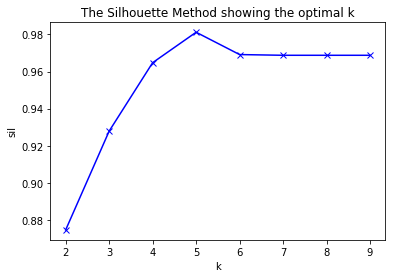

In [65]:
# Plot the elbow
k= range(2,10)
plt.plot(k, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('sil')
plt.title('The Silhouette Method showing the optimal k')
plt.show()

In [66]:
# The best number of clusters with min of cluster value is 6 from above chart
# set number of clusters
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=1).fit(Mumbai_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 0, 0, 1, 2, 0, 1, 1, 0, 3])

In [67]:
#Mumbai_grouped_clustering
#Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
# add clustering labels
Mumbai_grouped.insert(0,'Cluster Labels', kmeans.labels_)
Mumbai_merged = MumbaiLatLan

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
Mumbai_merged = Mumbai_merged.merge(Mumbai_grouped,how='inner',left_on=['Area'],right_on=['Neighborhood'])


Mumbai_merged.head() # check the last columns!

,Area,Location,Latitude,Longitude,Cluster Labels,Neighborhood,Shopping Mall_x,Theater_x,Shopping Mall_y,Theater_y
0,Amboli,"Andheri,Western Suburbs",19.1293,72.8434,0,Amboli,0,1,0.0,1.0
1,D.N. Nagar,"Andheri,Western Suburbs",19.124085,72.831373,0,D.N. Nagar,0,2,0.0,1.0
2,Four Bungalows,"Andheri,Western Suburbs",19.124714,72.82721,0,Four Bungalows,0,2,0.0,1.0
3,Lokhandwala,"Andheri,Western Suburbs",19.130815,72.82927,0,Lokhandwala,0,1,0.0,1.0
4,Seven Bungalows,"Andheri,Western Suburbs",19.129052,72.817018,0,Seven Bungalows,0,1,0.0,1.0


In [69]:
#updaating lables for each cluster
Mumbai_merged['Labels'] = Mumbai_merged['Cluster Labels'].map({0:'Only Theater',1:'Only Shopping Mall'
                                ,2:'66% Shopping Mall/33% Theater',3:'33% Shopping Mall/66% Theater'
                                ,4:'75% Shopping Mall/25% Theater'})
Mumbai_merged

,Area,Location,Latitude,Longitude,Cluster Labels,Neighborhood,Shopping Mall_x,Theater_x,Shopping Mall_y,Theater_y,Labels
0,Amboli,"Andheri,Western Suburbs",19.1293,72.8434,0,Amboli,0,1,0.000000,1.000000,Only Theater
1,D.N. Nagar,"Andheri,Western Suburbs",19.124085,72.831373,0,D.N. Nagar,0,2,0.000000,1.000000,Only Theater
2,Four Bungalows,"Andheri,Western Suburbs",19.124714,72.82721,0,Four Bungalows,0,2,0.000000,1.000000,Only Theater
3,Lokhandwala,"Andheri,Western Suburbs",19.130815,72.82927,0,Lokhandwala,0,1,0.000000,1.000000,Only Theater
4,Seven Bungalows,"Andheri,Western Suburbs",19.129052,72.817018,0,Seven Bungalows,0,1,0.000000,1.000000,Only Theater
5,Versova,"Andheri,Western Suburbs",19.12,72.82,0,Versova,0,1,0.000000,1.000000,Only Theater
6,Mira Road,"Mira-Bhayandar,Western Suburbs",19.284167,72.871111,0,Mira Road,0,1,0.000000,1.000000,Only Theater
7,Bandstand Promenade,"Bandra,Western Suburbs",19.042718,72.819132,0,Bandstand Promenade,0,1,0.000000,1.000000,Only Theater
8,I.C. Colony,"Borivali (West),Western Suburbs",19.247039,72.84983,0,I.C. Colony,0,2,0.000000,1.000000,Only Theater
9,Dahisa,Western Suburbs,19.250069,72.859347,0,Dahisa,0,3,0.000000,1.000000,Only Theater


In [71]:
#Finally, let's visualize the resulting clusters

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster,Labels, X1,X2 in zip(Mumbai_merged['Latitude'], Mumbai_merged['Longitude'], Mumbai_merged['Neighborhood'], Mumbai_merged['Cluster Labels'],Mumbai_merged['Labels'], Mumbai_merged['Shopping Mall_x'], Mumbai_merged['Theater_x']):
    label = folium.Popup(str(poi) + ' Area' +' has-'+ str(Labels)+'; Shopping Mall-'+str(X1)+' Theater-'+str(X2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [72]:
# get mumbai geojson data
mumbai_geo = r'https://raw.githubusercontent.com/datameet/PincodeBoundary/master/Mumbai/boundary.geojson' # geojson file

In [73]:
# get Mumbai area wise density information
Mumbai_den = pd.read_csv(r'C:\Users\Puneet\Desktop\Data_Casptone_project\Mumbai_density.csv')

Mumbai_den.head()

,Pincode,Area,Density_Square_Kilometer
0,400001,MUMBAI GPO,56253.20
1,400002,kalbadevi,56253.20
2,400003,Mandvi,56253.20
3,400004,girgaon,112734.44
4,400005,COLABA POST OFFICE,16867.76


In [74]:
# generate choropleth map to visualiaze the populatin density
map_mumbai = folium.Map(location=[latitude, longitude], zoom_start=11)

map_mumbai.choropleth(
    geo_data=mumbai_geo,
    data=Mumbai_den,
    columns=['Area', 'Density_Square_Kilometer'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Mumbai Population Density per KM'
)

# display map
map_mumbai

C:\ProgramData\Anaconda3\lib\site-packages\folium\folium.py:413: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [76]:
#Finally, let's visualize the resulting clusters and Mumbai city population density in a single map

# create map
map_clusters = map_mumbai

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster,Labels, X1,X2 in zip(Mumbai_merged['Latitude'], Mumbai_merged['Longitude'], Mumbai_merged['Neighborhood'], Mumbai_merged['Cluster Labels'],Mumbai_merged['Labels'], Mumbai_merged['Shopping Mall_x'], Mumbai_merged['Theater_x']):
    label = folium.Popup(str(poi) + ' Area' +' has-'+ str(Labels)+'; Shopping Mall-'+str(X1)+' Theater-'+str(X2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [ ]:
#The End